In [2]:
import pandas as pd
import numpy as np
import os
import sys

#https://www.kaggle.com/jeffd23/the-nature-conservancy-fisheries-monitoring/deep-learning-in-the-deep-blue-lb-1-279
#https://www.kaggle.com/narae78/the-nature-conservancy-fisheries-monitoring/fish-detection
#https://www.kaggle.com/andrelopes1705/the-nature-conservancy-fisheries-monitoring/lasagne-based-of-zfturbo-keras-code/code
#https://www.youtube.com/watch?v=qIUh3CEeTqg

In [3]:
TRAIN_PATH = './data/train'

In [4]:
def listFiles():
    map_dir_files = {}
    for d in os.listdir(TRAIN_PATH):
        d = os.path.join(TRAIN_PATH,d)
        if os.path.isdir(d):
            files = os.listdir(d)
            map_dir_files [d] = files
            sys.stderr.writelines("Nb files for %s: %d \n" % (d, len(files)))
    return map_dir_files

In [5]:
%time map_dir_files = listFiles()

Nb files for ./data/train\ALB: 1719 
Nb files for ./data/train\BET: 200 
Nb files for ./data/train\DOL: 117 
Nb files for ./data/train\LAG: 67 
Nb files for ./data/train\NoF: 465 
Nb files for ./data/train\OTHER: 299 
Nb files for ./data/train\SHARK: 176 


Wall time: 3.75 s


Nb files for ./data/train\YFT: 734 


In [6]:
from PIL import Image
import matplotlib.pyplot as plt
import random
%matplotlib inline

In [7]:
def plot_graph(fish, nbfiles, nbcolumns, is_random = True):
    files = os.listdir(fish)
    nblines = int(nbfiles / nbcolumns)
    fig, ax = plt.subplots(nrows=nblines, ncols=nbcolumns, figsize=(15,15))
    ax = ax.flatten()
   
    for i in range(0,nbfiles):
        f = random.choice(files) if is_random else files[i]
        img = Image.open(os.path.join(fish,f))
        ax[i].imshow(img)
        ax[i].set_xticks([])
        ax[i].set_yticks([])
        ax[i].set_title("%s h:%s w:%s" % (f, img.height,img.width))
    plt.tight_layout()

Wall time: 4.7 s


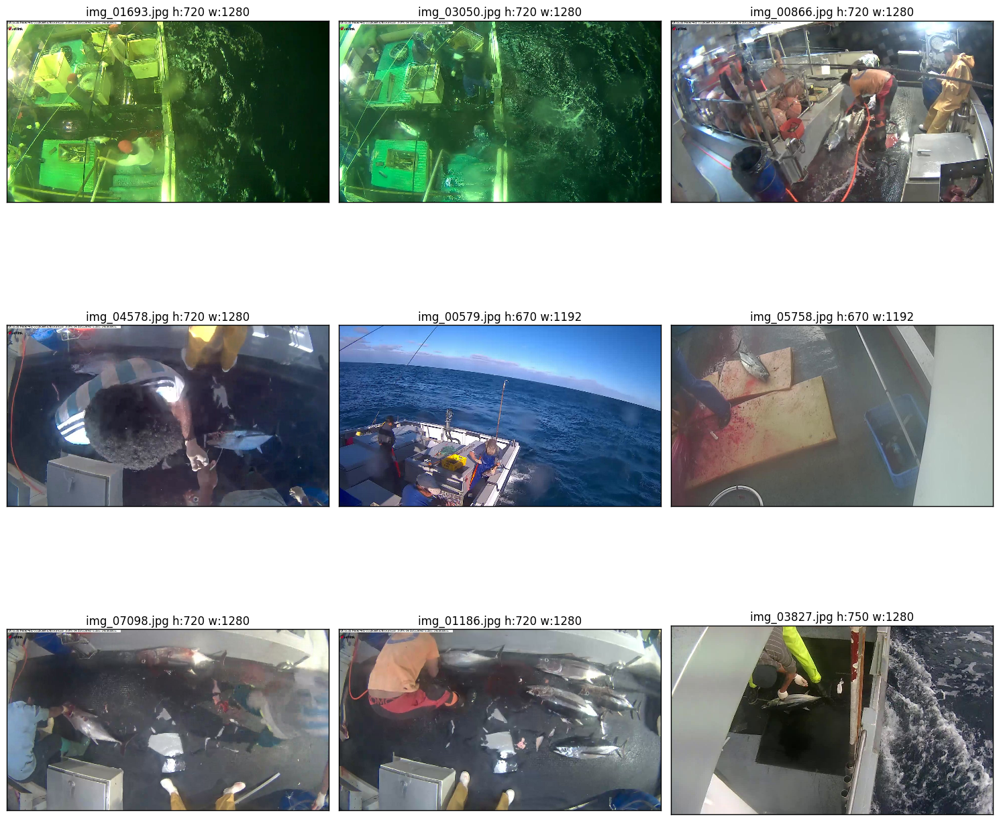

In [8]:
%time plot_graph(os.path.join(TRAIN_PATH,'ALB'), 9, 3 )

Wall time: 1.48 s


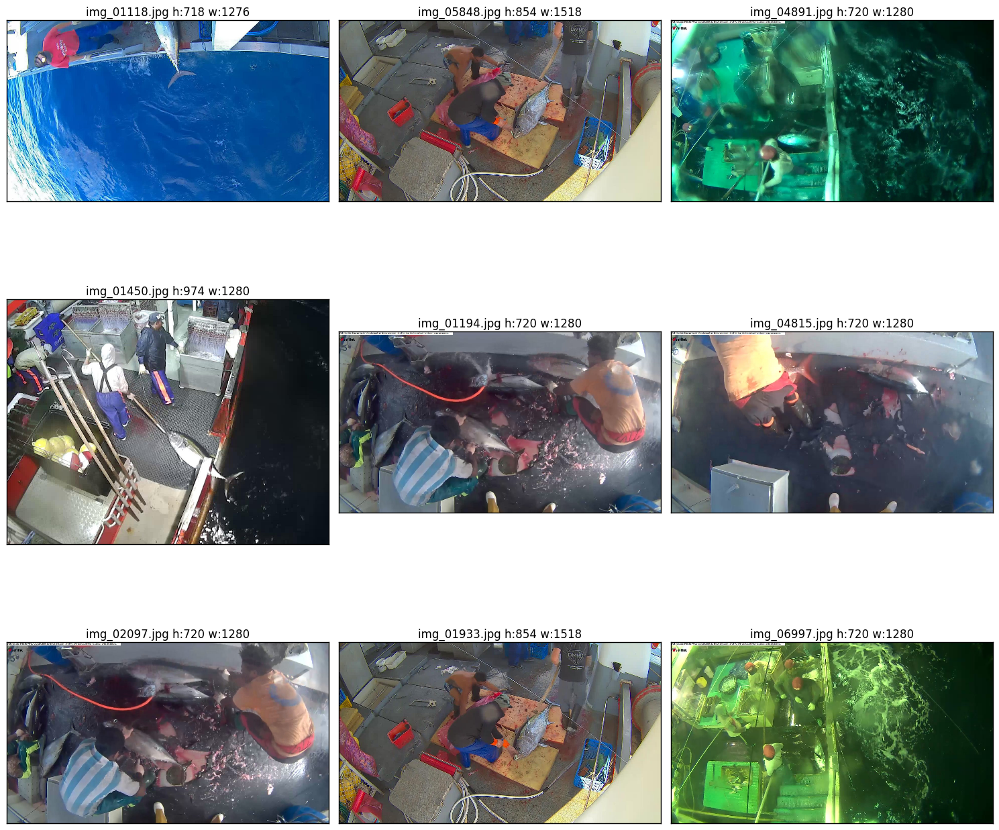

In [10]:
%time plot_graph(os.path.join(TRAIN_PATH,'BET'), 9, 3 )

Wall time: 1.91 s


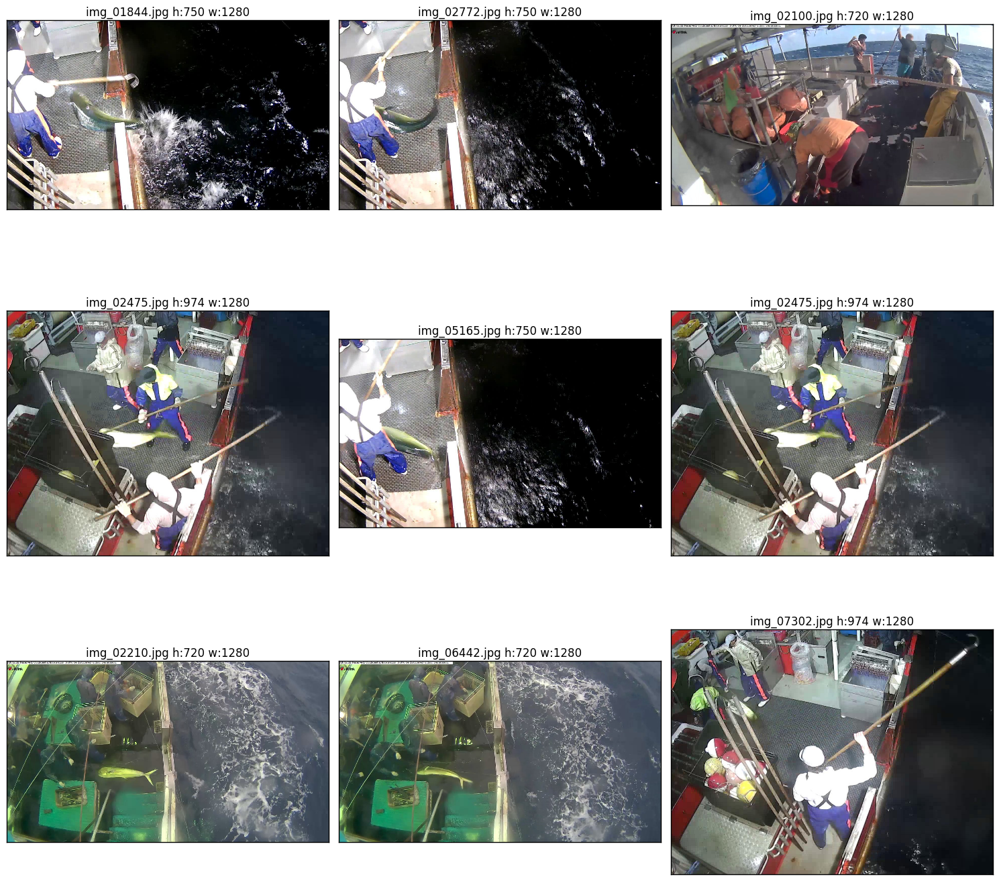

In [11]:
%time plot_graph(os.path.join(TRAIN_PATH,'DOL'), 9, 3 )

Wall time: 1.77 s


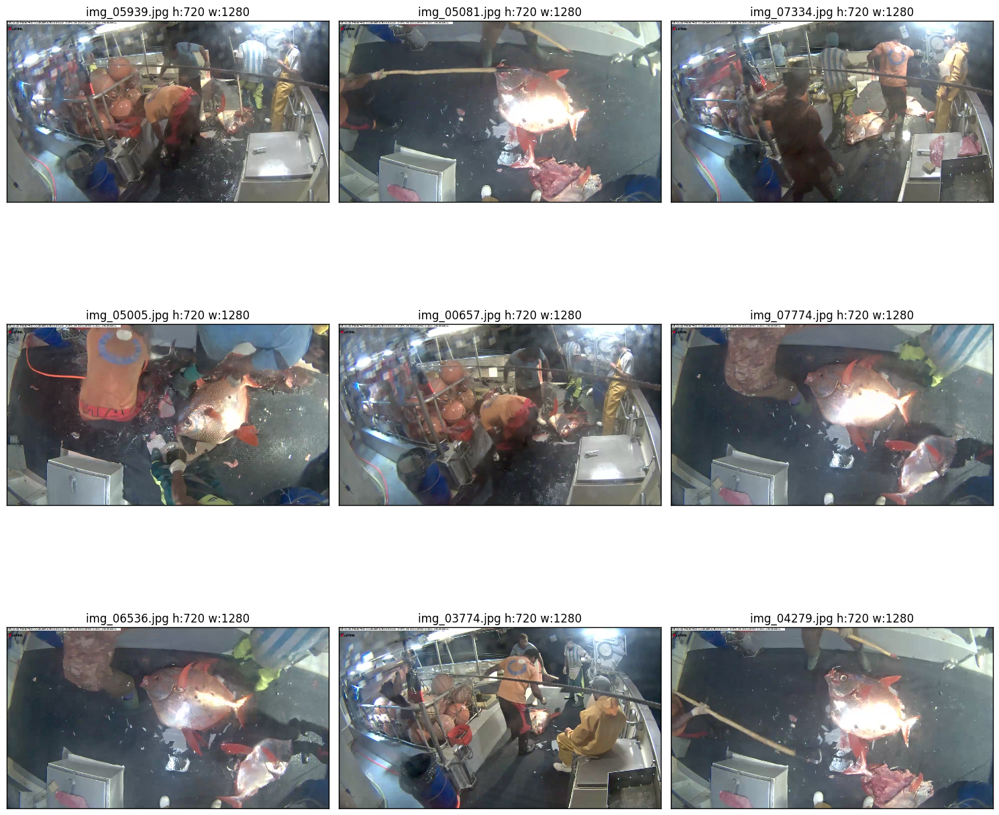

In [12]:
%time plot_graph(os.path.join(TRAIN_PATH,'LAG'), 9, 3 )

Wall time: 1.35 s


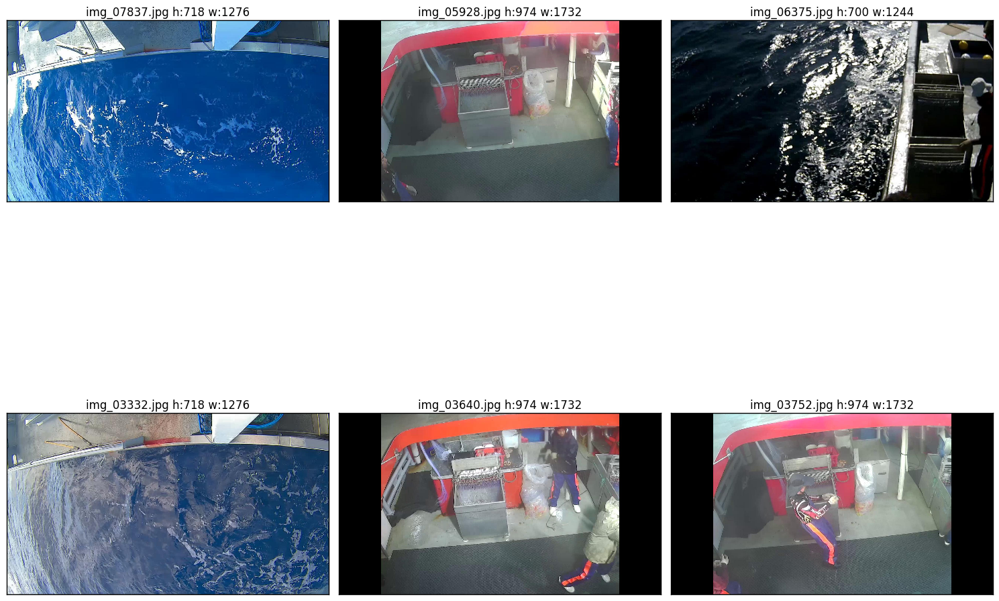

In [13]:
%time plot_graph(os.path.join(TRAIN_PATH,'Nof'),6, 3 )

In [14]:
def get_all_files(root_dir):
    list_files = []
    for root, subdirs, files in os.walk(root_dir):
            list_files.extend([os.path.join(root,f) for f in files])
    return list_files

In [15]:
%time list_files = get_all_files(TRAIN_PATH)
list_files[:10]

Wall time: 46.9 ms


['./data/train\\ALB\\img_00003.jpg',
 './data/train\\ALB\\img_00010.jpg',
 './data/train\\ALB\\img_00012.jpg',
 './data/train\\ALB\\img_00015.jpg',
 './data/train\\ALB\\img_00019.jpg',
 './data/train\\ALB\\img_00020.jpg',
 './data/train\\ALB\\img_00029.jpg',
 './data/train\\ALB\\img_00032.jpg',
 './data/train\\ALB\\img_00037.jpg',
 './data/train\\ALB\\img_00038.jpg']

In [16]:
np_files = np.array(list_files)
%time shapes = [Image.open(f).size for f in list_files]

Wall time: 1min 17s


In [17]:
import pandas as pd

In [18]:
pd.Series(shapes).value_counts()

(1280, 720)    2174
(1280, 750)     598
(1280, 974)     395
(1276, 718)     220
(1192, 670)     198
(1280, 924)      60
(1518, 854)      39
(1732, 974)      35
(1334, 750)      31
(1244, 700)      27
dtype: int64

## Data split

In [19]:
#conda install -c https://conda.binstar.org/menpo opencv3
import cv2
print (cv2.__version__)

3.1.0


In [20]:
N_COLS = 160
N_ROWS = 90

In [21]:
def build_X_y(files, COLS = 160, ROWS = 90,  CHANNELS =3):
    X = np.ndarray((len(files), ROWS, COLS, CHANNELS), dtype = np.float32)
    y = []
    
    for i,im in enumerate(files):
        fish = str.split(os.path.dirname(im), os.sep)[-1]
        if i%500 == 0:
            sys.stderr.writelines("file:%s y:%s  %d/%d \n" % (im.title(), fish, i ,len(files)))
            sys.stderr.flush()
        
        im = cv2.imread(im,cv2.IMREAD_COLOR)
        X[i] = cv2.resize(im, (COLS,ROWS), interpolation=cv2.INTER_CUBIC)
        y.append(fish)
    return X,y

In [22]:
%time X,y = build_X_y(list_files, COLS = N_COLS, ROWS = N_ROWS)

file:./Data/Train\Alb\Img_00003.Jpg y:ALB  0/3777 
file:./Data/Train\Alb\Img_02263.Jpg y:ALB  500/3777 
file:./Data/Train\Alb\Img_04683.Jpg y:ALB  1000/3777 
file:./Data/Train\Alb\Img_07078.Jpg y:ALB  1500/3777 
file:./Data/Train\Dol\Img_05446.Jpg y:DOL  2000/3777 
file:./Data/Train\Nof\Img_06610.Jpg y:NoF  2500/3777 
file:./Data/Train\Shark\Img_06082.Jpg y:SHARK  3000/3777 
file:./Data/Train\Yft\Img_04918.Jpg y:YFT  3500/3777 


Wall time: 3min 21s


In [23]:
FOLDER_RESIZED = 'RESIZED'
if not os.path.exists(FOLDER_RESIZED):
    os.mkdir(FOLDER_RESIZED)

In [24]:
for i in range(12):
    im = random.choice(X)
    im_name = os.path.join(FOLDER_RESIZED,"im_%s.jpg" % i)
    %time cv2.imwrite(im_name, im)

Wall time: 615 ms
Wall time: 66.5 ms
Wall time: 156 ms
Wall time: 93.2 ms
Wall time: 15.6 ms
Wall time: 0 ns
Wall time: 15.6 ms
Wall time: 418 ms
Wall time: 19.1 ms
Wall time: 14 ms
Wall time: 80.8 ms
Wall time: 31.3 ms


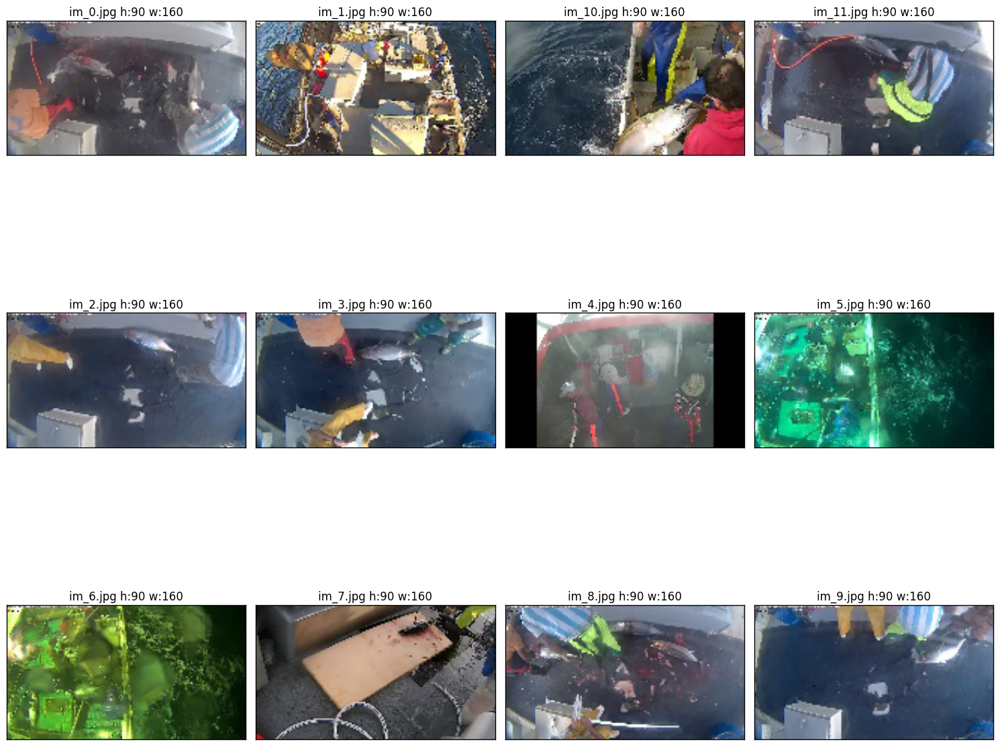

In [25]:
plot_graph(FOLDER_RESIZED,12,4,is_random = False)

In [26]:
from sklearn.cross_validation import train_test_split

In [27]:
%time X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state=42, stratify=y)

Wall time: 2.05 s


In [35]:
from sklearn.preprocessing import OneHotEncoder
y_encoded = pd.get_dummies(y)
y_encoded = y_encoded.values
y_encoded

array([[ 1.,  0.,  0., ...,  0.,  0.,  0.],
       [ 1.,  0.,  0., ...,  0.,  0.,  0.],
       [ 1.,  0.,  0., ...,  0.,  0.,  0.],
       ..., 
       [ 0.,  0.,  0., ...,  0.,  0.,  1.],
       [ 0.,  0.,  0., ...,  0.,  0.,  1.],
       [ 0.,  0.,  0., ...,  0.,  0.,  1.]])

In [49]:
sys.stderr.writelines('Nb values: %d \n' % len(y_train))

alb_ratio_train = np.count_nonzero(np.asarray(y_train) == 'ALB') / len(y_train)
sys.stderr.writelines('Ratio ALB in train: %f \n' % alb_ratio_train)

alb_ratio_test = np.count_nonzero(np.asarray(y_test) == 'ALB') / len(y_test)
sys.stderr.writelines('Ratio ALB in test: %f \n' % alb_ratio_test)

dol_ratio_train = np.count_nonzero(np.asarray(y_train) == 'DOL') / len(y_train)
sys.stderr.writelines('Ratio DOL in train: %f \n' % dol_ratio_train)

dol_ratio_test = np.count_nonzero(np.asarray(y_test) == 'DOL') / len(y_test)
sys.stderr.writelines('Ratio DOL in test: %f \n' % dol_ratio_test)

Nb values: 3022 
Ratio ALB in train: 0.454997 
Ratio ALB in test: 0.455629 
Ratio DOL in train: 0.031105 
Ratio DOL in test: 0.030464 


In [50]:
shapes = [x.shape for x in X]
pd.Series(shapes).value_counts()

(90, 160, 3)    3777
dtype: int64

## Tensor Flow

In [51]:
#conda install -c conda-forge tensorflow
import tensorflow as tf

In [53]:
N_OUTPUT= 8

In [54]:
sess = tf.InteractiveSession()

In [ ]:
'''weights = {'w_conv1' : tf.Variable(tf.truncated_normal([5,5,3,64], mean=0.0, stddev=0.1, dtype=tf.float32)),
           'w_conv2' : tf.Variable(tf.truncated_normal([5,5,64,128], mean=0.0, stddev=0.1, dtype=tf.float32)),
           'fc'      : tf.Variable(tf.truncated_normal([7 * 7 * 64, 1024], mean=0.0, stddev=0.1, dtype=tf.float32)),
           'out'     : tf.Variable(tf.truncated_normal([1024, N_CLASSES], mean=0.0, stddev=0.1, dtype=tf.float32))}

biases = {,
          'bias_2' : tf.Variable(tf.truncated_normal([128], mean=0.0, stddev=0.1, dtype=tf.float32)),
          'bias_fc' : tf.Variable(tf.truncated_normal([1024], mean=0.0, stddev=0.1, dtype=tf.float32)),
          'bias_out' :  tf.Variable(tf.truncated_normal([N_CLASSES], mean=0.0, stddev=0.1, dtype=tf.float32))}''''''

Constants are initialized when you call tf.constant, and their value can never change. By contrast, variables are not initialized when you call tf.Variable. To initialize all the variables in a TensorFlow program, you must explicitly call a special operation as follows:

# Input

In [67]:
X_tf = tf.placeholder(tf.float32, shape=[90, 160, 3])

In [68]:
X_tf = tf.reshape(X_tf, [-1, 90, 160, 3])# -1 can also be used to infer the shape(https://www.tensorflow.org/api_docs/python/tf/reshape)

## 1st Convolutional Layer

In [69]:
w_conv1 =  tf.Variable(tf.truncated_normal([5,5,3,64], mean=0.0, stddev=0.1, dtype=tf.float32))

In [70]:
bias_1 = tf.Variable(tf.truncated_normal([64], mean=0.0, stddev=0.1, dtype=tf.float32))

In [79]:
h_conv1 = tf.nn.conv2d(X_tf, w_conv1, strides=[1, 1, 1, 1], padding='SAME') + bias_1 #(86 * 156 * 64)

# 1st Relu

In [78]:
h_relu1 = tf.nn.relu(h_conv1)  #(86 * 56 * 64)

## 1st Pooling

In [80]:
h_pool1 = tf.nn.max_pool(h_relu1, ksize=[1,2,2,1], strides=[1,2,2,1], padding='SAME') #43 * 78 *64

## 2nd Convolutional layer

In [82]:
w_conv2 = tf.Variable(tf.truncated_normal([5, 5, 64, 128], mean=0.0, stddev=0.1, dtype=tf.float32))

In [84]:
bias_2 = tf.Variable(tf.truncated_normal([128], mean=0.0, stddev=0.1, dtype=tf.float32))

In [85]:
h_conv2 = tf.nn.conv2d(h_pool1, w_conv2, strides=[1,1,1,1], padding='SAME') + bias_2

## 2nd Relu

In [86]:
h_relu2 = tf.nn.relu(h_conv2)

## 2nd Pooling

In [87]:
h_pool2 = tf.nn.max_pool(h_relu2, ksize=[1,2,2,1], strides=[1,2,2,1], padding='SAME')

In [ ]:
init = tf.global_variables_initializer()
sess.run(init)